# Screw Detection Optimization: From Baseline to SAHI
## A Comprehensive Pipeline for Small Object Detection

This notebook documents the entire development cycle of a high-precision screw detection system. We address the challenge of detecting tiny objects (10-15px) within high-resolution images (1920x1080) using **YOLOv8** and **Slicing Aided Hyper Inference (SAHI)**.


### Our Dataset Journey 
1. **Raw Source**: We started with the [raw, unannotated Screw/Washer Dataset](https://www.kaggle.com/datasets/wjybuqi/screwwasher-dataset-for-small-object-detection) from Kaggle.
2. **Annotation**: To ensure high-quality training, we manually annotated the dataset using **Roboflow**, specifically targeting the unique challenges of tiny industrial components.
3. **Public Release**: The final, fully annotated dataset was uploaded back to Kaggle to be easy for download: [Bolts and Washers Annotated Dataset](https://www.kaggle.com/datasets/ahmedmohamedab/bolts-and-washers).

## Environment Setup and Dependencies

We leverage `ultralytics` for YOLOv8 model handling and `sahi` (Slicing Aided Hyper Inference) to enhance performance on small objects.

In [ ]:
%pip install -U ultralytics sahi openvino-dev nncf onnx onnxslim pyyaml psutil opencv-python matplotlib


In [ ]:
import os
import random
import shutil
import time
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import psutil
import torch
import yaml
from sahi import AutoDetectionModel
from sahi.predict import get_sliced_prediction
from sahi.slicing import slice_image
from sahi.utils.cv import read_image, visualize_object_predictions
from tqdm import tqdm
from ultralytics import YOLO



## 1. Project Overview & Dataset Stats

The dataset consists of 250 images with ~ 8,000 annotations. We begin by analyzing the raw dataset metrics.

In [ ]:

def calculate_stats(data_yaml_path):
    with open(data_yaml_path, 'r') as f:
        data = yaml.safe_load(f)
    
    stats = {}
    splits = ['train', 'val', 'test']
    
    total_images = 0
    total_annotations = 0
    all_widths = []
    all_heights = []
    objects_per_image = []

    for split in splits:
        if split not in data:
            continue
            
        img_path = Path('data') / data[split]
        label_path = img_path.parent / 'labels'
        
        images = list(img_path.glob('*.jpg')) + list(img_path.glob('*.png')) + list(img_path.glob('*.jpeg'))
        num_images = len(images)
        total_images += num_images
        
        num_annos = 0
        split_objects = []
        
        for img_file in images:
            l_file = label_path / (img_file.stem + '.txt')
            if l_file.exists():
                with open(l_file, 'r') as f:
                    lines = f.readlines()
                    num_annos += len(lines)
                    split_objects.append(len(lines))
                    for line in lines:
                        parts = list(map(float, line.split()))
                        if len(parts) >= 5:
                            cls = int(parts[0])
                            coords = parts[1:]
                            if len(coords) == 4:
                                x, y, bw, bh = coords
                            else:
                                xs = coords[0::2]
                                ys = coords[1::2]
                                bw = max(xs) - min(xs)
                                bh = max(ys) - min(ys)
                            
                            all_widths.append(bw)
                            all_heights.append(bh)
            else:
                split_objects.append(0)
        
        total_annotations += num_annos
        objects_per_image.extend(split_objects)
        
        stats[split] = {
            'images': num_images,
            'annotations': num_annos,
            'avg_objects': num_annos / num_images if num_images > 0 else 0
        }

    overall_stats = {
        'total_images': total_images,
        'total_annotations': total_annotations,
        'avg_objects_per_image': total_annotations / total_images if total_images > 0 else 0,
        'bbox_size_dist': {
            'mean_width': np.mean(all_widths) if all_widths else 0,
            'mean_height': np.mean(all_heights) if all_heights else 0,
            'std_width': np.std(all_widths) if all_widths else 0,
            'std_height': np.std(all_heights) if all_heights else 0
        }
    }
    
    print("\n--- Dataset Statistics ---")
    for split, s in stats.items():
        print(f"{split.capitalize()}: {s['images']} images, {s['annotations']} annotations, {s['avg_objects']:.2f} avg objects/image")
    
    print(f"\nOverall:")
    print(f"  Total Images: {overall_stats['total_images']}")
    print(f"  Total Annotations: {overall_stats['total_annotations']}")
    print(f"  Avg Objects/Image: {overall_stats['avg_objects_per_image']:.2f}")
    print(f"  BBox Distribution (Normalized):")
    print(f"    Avg Width: {overall_stats['bbox_size_dist']['mean_width']:.4f}")
    print(f"    Avg Height: {overall_stats['bbox_size_dist']['mean_height']:.4f}")

    # Save to file
    os.makedirs('results', exist_ok=True)
    with open('results/stats.txt', 'w') as f:
        f.write("Dataset Statistics\n")
        f.write("==================\n")
        for split, s in stats.items():
            f.write(f"{split.capitalize()}: {s['images']} images, {s['annotations']} annotations, {s['avg_objects']:.2f} avg objects/image\n")
        f.write(f"\nOverall:\n")
        f.write(f"  Total Images: {overall_stats['total_images']}\n")
        f.write(f"  Total Annotations: {overall_stats['total_annotations']}\n")
        f.write(f"  Avg Objects/Image: {overall_stats['avg_objects_per_image']:.2f}\n")
        f.write(f"  BBox Distribution (Normalized):\n")
        f.write(f"    Avg Width: {overall_stats['bbox_size_dist']['mean_width']:.4f}\n")
        f.write(f"    Avg Height: {overall_stats['bbox_size_dist']['mean_height']:.4f}\n")

calculate_stats('data/data.yaml')



--- Dataset Statistics ---
Train: 225 images, 7749 annotations, 34.44 avg objects/image
Val: 15 images, 548 annotations, 36.53 avg objects/image
Test: 10 images, 382 annotations, 38.20 avg objects/image

Overall:
  Total Images: 250
  Total Annotations: 8679
  Avg Objects/Image: 34.72
  BBox Distribution (Normalized):
    Avg Width: 0.0246
    Avg Height: 0.0448


## 2. Visual Ground Truth Verification

Before proceeding to inference or training, we verify the integrity of our labels. This cell visualizes random samples with their bounding boxes to confirm coordinate precision and class alignment.

Visualization saved to results\sample_visualizations.png


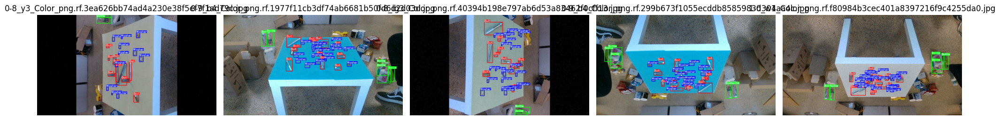

In [ ]:

def plot_one_box(x, img, color=None, label=None, line_thickness=3):
    # Plots one bounding box on image img
    tl = line_thickness or round(0.002 * (img.shape[0] + img.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(img, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label:
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(label, 0, fontScale=tl / 3, thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(img, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(img, label, (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)

def visualize_yolo(data_yaml_path, num_samples=5, output_dir='results'):
    with open(data_yaml_path, 'r') as f:
        data = yaml.safe_load(f)
    
    names = data['names']
    train_path = Path('data') / data['train']
    image_dir = train_path # data/train/images
    label_dir = train_path.parent / 'labels' # data/train/labels
    
    image_files = list(image_dir.glob('*.jpg')) + list(image_dir.glob('*.png')) + list(image_dir.glob('*.jpeg'))
    if not image_files:
        print(f"No images found in {image_dir}")
        return

    samples = random.sample(image_files, min(num_samples, len(image_files)))
    os.makedirs(output_dir, exist_ok=True)

    fig, axes = plt.subplots(1, len(samples), figsize=(20, 10))
    if len(samples) == 1:
        axes = [axes]

    # Fixed color palette for classes
    colors = [
        (255, 0, 0),    # Red
        (0, 255, 0),    # Green
        (0, 0, 255),    # Blue
        (255, 255, 0),  # Yellow
        (255, 0, 255),  # Magenta
        (0, 255, 255),  # Cyan
    ]

    for i, img_path in enumerate(samples):
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w, _ = img.shape
        
        label_path = label_dir / (img_path.stem + '.txt')
        if label_path.exists():
            with open(label_path, 'r') as f:
                lines = f.readlines()
                for line in lines:
                    parts = list(map(float, line.split()))
                    cls = int(parts[0])
                    coords = parts[1:]
                    
                    if len(coords) == 4:
                        # Standard YOLO bbox format: x_center, y_center, width, height
                        x, y, bw, bh = coords
                        x1 = int((x - bw/2) * w)
                        y1 = int((y - bh/2) * h)
                        x2 = int((x + bw/2) * w)
                        y2 = int((y + bh/2) * h)
                    elif len(coords) >= 6:
                        # YOLO segmentation format: x1, y1, x2, y2, x3, y3, ...
                        xs = coords[0::2]
                        ys = coords[1::2]
                        x1 = int(min(xs) * w)
                        y1 = int(min(ys) * h)
                        x2 = int(max(xs) * w)
                        y2 = int(max(ys) * h)
                    else:
                        continue
                     
                    color = colors[cls % len(colors)]
                    plot_one_box([x1, y1, x2, y2], img, label=names[cls], color=color)
        
        axes[i].imshow(img)
        axes[i].set_title(img_path.name)
        axes[i].axis('off')
        
    plt.tight_layout()
    save_path = os.path.join(output_dir, 'sample_visualizations.png')
    plt.savefig(save_path)
    print(f"Visualization saved to {save_path}")
    plt.show()

visualize_yolo('data/data.yaml')


## 3. Baseline YOLOv8 Inference (Global Resize)

We establish a performance ceiling using standard 1280px resized inference. This represents the "standard" path which often misses tiny 10-15px objects due to interpolation artifacts during downsampling.


In [ ]:

def train_model():
    # 1. Initialize YOLOv8-small model
    # We use 'yolov8s.pt' as the base model
    model = YOLO('yolov8s.pt')

    # 2. Define training parameters
    # imgsz=1280: High resolution to preserve small object details
    # batch=8: Scaling factor for memory
    # epochs=100: Total iterations
    # patience=20: Early stopping if no improvement
    # optimizer='AdamW': Often better for small objects/complex datasets
    # augmentations: mosaic, mixup, scale (default in YOLOv8, but we can explicitly set them)
    
    results = model.train(
        data='data/data.yaml',
        imgsz=1280,
        epochs=100,
        batch=4,
        patience=20,
        optimizer='AdamW',
        mosaic=1.0,  # Enable mosaic
        mixup=0.1,   # Enable mixup
        scale=0.5,   # Scale augmentation
        project='results',
        name='train_yolov8_1280',
        exist_ok=True,
        save=True,
        device=0 if torch.cuda.is_available() else 'cpu'
    )

    # 3. Save the best model weights to models/
    # The best weights are usually saved automatically in the run directory
    # We will copy/rename it to the requested location
    best_weights_path = os.path.join('results', 'train_yolov8s_1280', 'weights', 'best.pt')
    target_weights_path = os.path.join('models', 'yolov8s_1280_best.pt')
    
    if os.path.exists(best_weights_path):
        import shutil
        os.makedirs('models', exist_ok=True)
        shutil.copy(best_weights_path, target_weights_path)
        print(f"Best model weights saved to {target_weights_path}")
    else:
        print("Warning: Best weights not found. Check training logs.")

train_model()


In [ ]:

def get_iou(boxA, boxB):
    # box = [x1, y1, x2, y2]
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

def evaluate_baseline(model_path, data_yaml_path, output_dir='results/baseline'):
    # Load model and data
    model = YOLO(model_path)
    with open(data_yaml_path, 'r') as f:
        data_cfg = yaml.safe_load(f)
    
    os.makedirs(output_dir, exist_ok=True)
    
    # 1. Run standard validation
    print("Running standard validation on test set...")
    val_results = model.val(data=data_yaml_path, imgsz=1280, split='test', project=output_dir, name='val_standard')
    
    # Extract standard metrics
    metrics = {
        'mAP50': val_results.results_dict['metrics/mAP50(B)'],
        'mAP50-95': val_results.results_dict['metrics/mAP50-95(B)'],
        'Precision': val_results.results_dict['metrics/precision(B)'],
        'Recall': val_results.results_dict['metrics/recall(B)'],
        'F1': 2 * (val_results.results_dict['metrics/precision(B)'] * val_results.results_dict['metrics/recall(B)']) / 
              (val_results.results_dict['metrics/precision(B)'] + val_results.results_dict['metrics/recall(B)'] + 1e-9)
    }

    # 2. Custom Size-Based Analysis
    test_img_dir = Path(data_cfg['test'])
    test_label_dir = test_img_dir.parent / 'labels'
    
    image_files = list(test_img_dir.glob('*.jpg')) + list(test_img_dir.glob('*.png'))
    
    size_stats = {
        'small (<15px)': {'gt': 0, 'tp': 0},
        'medium (15-30px)': {'gt': 0, 'tp': 0},
        'large (>30px)': {'gt': 0, 'tp': 0}
    }
    
    total_fp = 0
    visualized_images = 0
    
    print(f"Processing {len(image_files)} test images for size-based analysis...")
    
    for img_path in image_files:
        # Run inference
        results = model.predict(img_path, imgsz=1280, conf=0.25, verbose=False)[0]
        preds = results.boxes.xyxy.cpu().numpy() # [x1, y1, x2, y2]
        
        # Load GT
        label_path = test_label_dir / (img_path.stem + '.txt')
        gt_boxes = []
        if label_path.exists():
            img = cv2.imread(str(img_path))
            h, w, _ = img.shape
            with open(label_path, 'r') as f:
                for line in f:
                    parts = list(map(float, line.split()))
                    coords = parts[1:]
                    if len(coords) == 4:
                        x, y, bw, bh = coords
                        x1, y1 = (x - bw/2) * w, (y - bh/2) * h
                        x2, y2 = (x + bw/2) * w, (y + bh/2) * h
                    else:
                        xs, ys = coords[0::2], coords[1::2]
                        x1, y1, x2, y2 = min(xs)*w, min(ys)*h, max(xs)*w, max(ys)*h
                    
                    max_dim = max(x2-x1, y2-y1)
                    category = 'large (>30px)'
                    if max_dim < 15: category = 'small (<15px)'
                    elif max_dim < 30: category = 'medium (15-30px)'
                    
                    gt_boxes.append({'box': [x1, y1, x2, y2], 'cat': category, 'matched': False})
                    size_stats[category]['gt'] += 1

        # Match Preds to GT
        matched_preds = [False] * len(preds)
        for gt in gt_boxes:
            best_iou = 0
            best_idx = -1
            for i, pred in enumerate(preds):
                if matched_preds[i]: continue
                iou = get_iou(gt['box'], pred)
                if iou > 0.5 and iou > best_iou:
                    best_iou = iou
                    best_idx = i
            
            if best_idx != -1:
                gt['matched'] = True
                matched_preds[best_idx] = True
                size_stats[gt['cat']]['tp'] += 1
        
        total_fp += sum(1 for m in matched_preds if not m)

        # 3. Visualization (GT=Green, Pred=Red)
        if visualized_images < 10:
            img = cv2.imread(str(img_path))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            # Draw GT
            for gt in gt_boxes:
                b = list(map(int, gt['box']))
                cv2.rectangle(img, (b[0], b[1]), (b[2], b[3]), (0, 255, 0), 2)
            
            # Draw Preds
            for pred in preds:
                b = list(map(int, pred))
                cv2.rectangle(img, (b[0], b[1]), (b[2], b[3]), (255, 0, 0), 2)
            
            plt.figure(figsize=(12, 8))
            plt.imshow(img)
            plt.title(f"Baseline: GT (Green) vs Pred (Red) - {img_path.name}")
            plt.axis('off')
            plt.savefig(os.path.join(output_dir, f"sample_{visualized_images}.png"))
            plt.close()
            visualized_images += 1

    # 4. Generate Report
    print("\nBaseline YOLOv8 Performance Report (1280px)")
    print("===========================================\n")
    print("Global Metrics:")
    for k, v in metrics.items():
        print(f"- {k}: {v:.4f}")
    
    print("\nSize-Based Detection Analysis:")
    for cat, s in size_stats.items():
        miss_rate = (s['gt'] - s['tp']) / s['gt'] if s['gt'] > 0 else 0
        print(f"- {cat}: GT={s['gt']}, TP={s['tp']}, Miss Rate={miss_rate:.2%}")
    
    print(f"\nTotal False Positives: {total_fp}")
    if size_stats['small (<15px)']['gt'] > 0:
        small_miss_rate = (size_stats['small (<15px)']['gt'] - size_stats['small (<15px)']['tp']) / size_stats['small (<15px)']['gt']
        print(f"Miss Rate for screws < 15px: {small_miss_rate:.2%}")
    else:
        print("\nNo small screws found in test set.")

    print("\nBaseline evaluation complete.")

evaluate_baseline('models/yolov8s_1280_best.pt', 'data/data.yaml')


Running standard validation on test set...
Ultralytics 8.4.6  Python-3.11.14 torch-2.9.1+cpu CPU (Intel Xeon W-2133 CPU @ 3.60GHz)
Model summary (fused): 73 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 830.7133.7 MB/s, size: 178.3 KB)
val: Scanning E:\AI\Projects\Internship Tasks\project\data\test\labels.cache... 10 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 10/10  0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 5.2s/it 5.2s
                   all         10        382       0.89      0.894      0.909      0.762
                  Bolt         10        111       0.87      0.865       0.89      0.732
                Bottle         10         71      0.889      0.958      0.922      0.865
                Washer         10        200       0.91       0.86      0.916      0.689
Speed: 4.6ms preprocess, 480.0ms inference, 0.0ms loss, 1.6ms postprocess per 

## 4. SAHI Inference Implementation

To recover small objects, we implement **Slicing Aided Hyper Inference**. By processing the image in 640px slices at native resolution, we maintain the structural integrity of the smallest screw heads.

Performing prediction on 8 slices.


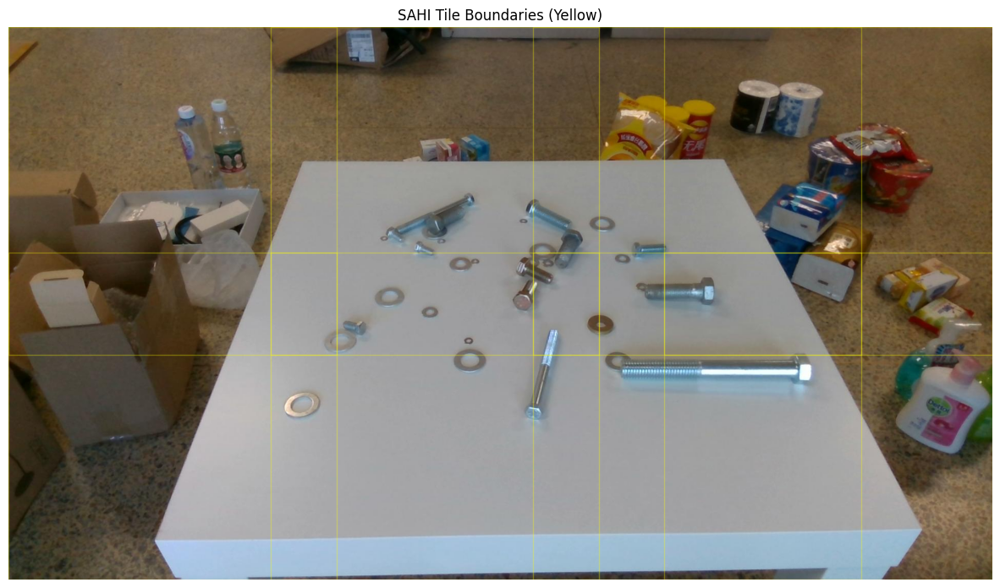

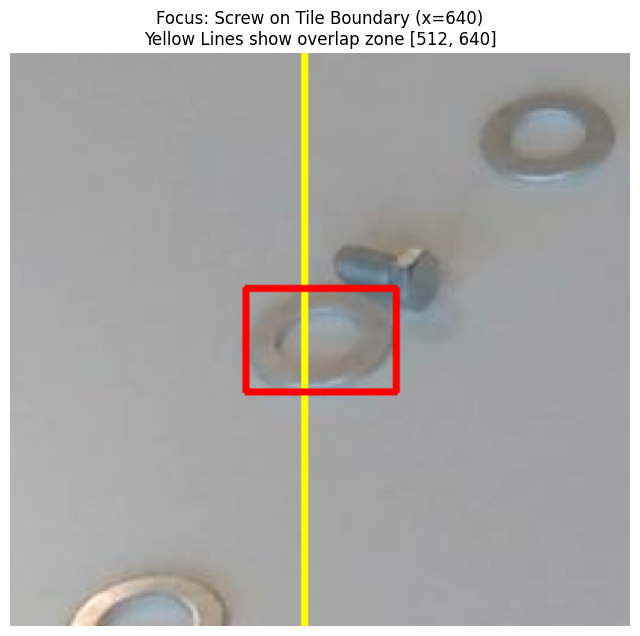

In [ ]:

def visualize_sahi_boundary_logic(model_path, image_path, output_dir='results/sahi_edge_case'):
    os.makedirs(output_dir, exist_ok=True)
    
    # 1. Load Model
    detection_model = AutoDetectionModel.from_pretrained(
        model_type="yolov8",
        model_path=model_path,
        confidence_threshold=0.25,
        device="cuda:0" if torch.cuda.is_available() else "cpu",
    )

    # 2. Slice image manually to show borders
    # Standard SAHI logic: slice_height=640, overlap=128 (20%)
    slice_height = 640
    slice_width = 640
    overlap_height_ratio = 0.2
    overlap_width_ratio = 0.2
    
    # We'll use SAHI's internal slicing to show how tiles are generated
    slice_image_result = slice_image(
        image=image_path,
        slice_height=slice_height,
        slice_width=slice_width,
        overlap_height_ratio=overlap_height_ratio,
        overlap_width_ratio=overlap_width_ratio,
    )
    
    # 3. Run Sliced Prediction
    prediction_result = get_sliced_prediction(
        image_path,
        detection_model,
        slice_height=slice_height,
        slice_width=slice_width,
        overlap_height_ratio=overlap_height_ratio,
        overlap_width_ratio=overlap_width_ratio,
        postprocess_type="NMS",
        postprocess_match_threshold=0.5,
    )

    # 4. Visualization
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape
    
    # Figure 1: Tile Boundaries
    fig, ax = plt.subplots(figsize=(15, 10))
    ax.imshow(img)
    
    # Draw tile boundaries manually
    # Slices are at i * (640 - 128)
    stride_h = slice_height - int(slice_height * overlap_height_ratio)
    stride_w = slice_width - int(slice_width * overlap_width_ratio)
    
    for y in range(0, h, stride_h):
        for x in range(0, w, stride_w):
            actual_x = min(x, w - slice_width) if x + slice_width > w else x
            actual_y = min(y, h - slice_height) if y + slice_height > h else y
            rect = plt.Rectangle((actual_x, actual_y), slice_width, slice_height, linewidth=1, edgecolor='yellow', facecolor='none', alpha=0.3)
            ax.add_patch(rect)
            if actual_x == w - slice_width: break
        if actual_y == h - slice_height: break
    
    ax.set_title("SAHI Tile Boundaries (Yellow)")
    plt.axis('off')
    plt.show()

    # Figure 2: Zoom on an edge case (if possible)
    boundary_x = 640 
    
    edge_pred = None
    for pred in prediction_result.object_prediction_list:
        b = pred.bbox 
        if b.minx < boundary_x < b.maxx:
            edge_pred = pred
            break
            
    if edge_pred:
        b = edge_pred.bbox
        zoom_pad = 100
        x1, y1 = max(0, int(b.minx - zoom_pad)), max(0, int(b.miny - zoom_pad))
        x2, y2 = min(w, int(b.maxx + zoom_pad)), min(h, int(b.maxy + zoom_pad))
        
        zoom_img = img[y1:y2, x1:x2].copy()
        
        # Border drawing
        cv2.line(zoom_img, (640 - x1, 0), (640 - x1, y2-y1), (255, 255, 0), 2) 
        cv2.line(zoom_img, (512 - x1, 0), (512 - x1, y2-y1), (0, 255, 255), 2) 
        cv2.rectangle(zoom_img, (int(b.minx - x1), int(b.miny - y1)), (int(b.maxx - x1), int(b.maxy - y1)), (255, 0, 0), 2)
        
        plt.figure(figsize=(8, 8))
        plt.imshow(zoom_img)
        plt.title(f"Focus: Screw on Tile Boundary (x={boundary_x})\nYellow Lines show overlap zone [512, 640]")
        plt.axis('off')
        plt.show()
    else:
        print("No perfect edge case found in this sample, showing tile boundaries only.")


image_path = 'data/test/images/0-7_w2_Color_png.rf.d404b04750f707209610f501443ecb80.jpg'
visualize_sahi_boundary_logic(
    model_path='models/yolov8s_1280_best.pt',
    image_path=image_path
)


Processing 0-7_w2_Color_png.rf.d404b04750f707209610f501443ecb80.jpg with SAHI...
Performing prediction on 8 slices.


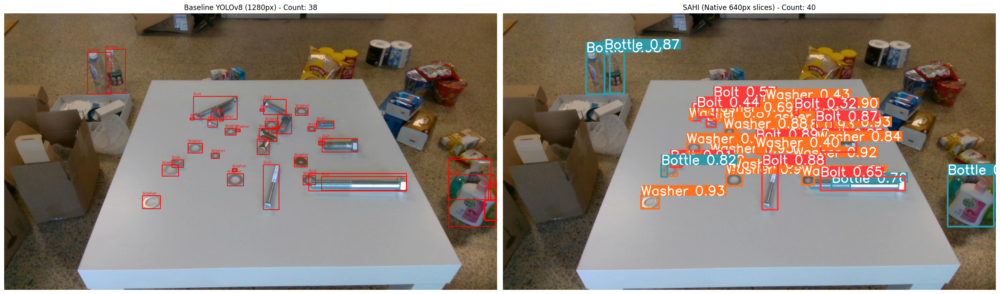

Processing 0-8_c3_Color_png.rf.b83c07bc3b97562a9f2398f6cb8c3b95.jpg with SAHI...
Performing prediction on 8 slices.


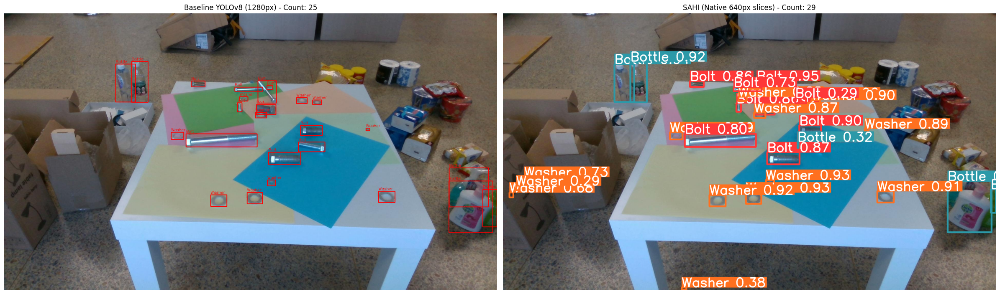

Processing 0-9_g2_Color_png.rf.5211e59c25085627a950d5ec3bd16f04.jpg with SAHI...
Performing prediction on 8 slices.


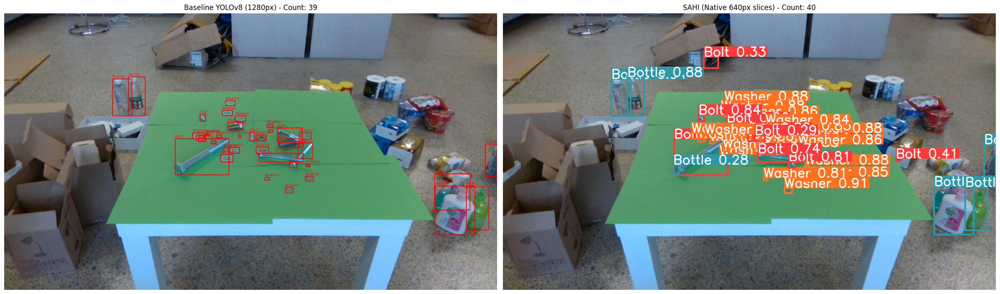

Processing 0-9_w3_Color_png.rf.2fe4092f25c013bb1d5686e26aa2b4f3.jpg with SAHI...
Performing prediction on 8 slices.


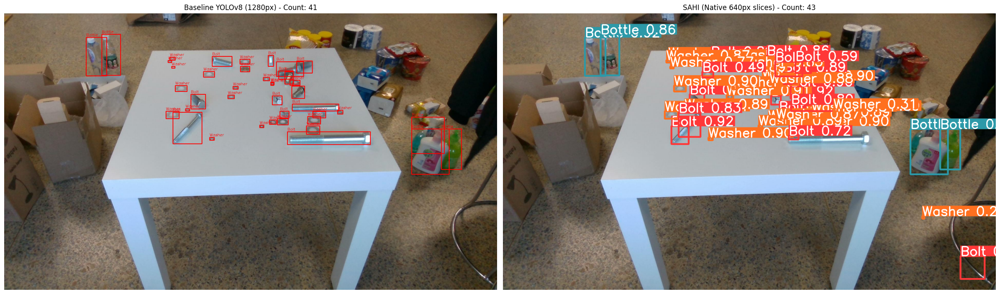

Processing 1-0_lg3_Color_png.rf.529ff7dc050fa1321c51a31db181035c.jpg with SAHI...
Performing prediction on 8 slices.


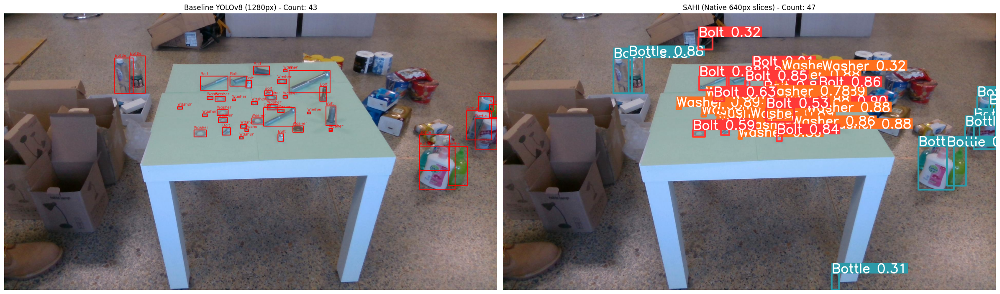


SAHI vs Baseline Comparison:
- 0-7_w2_Color_png.rf.d404b04750f707209610f501443ecb80.jpg: SAHI=40, Baseline=38 (+2)
- 0-8_c3_Color_png.rf.b83c07bc3b97562a9f2398f6cb8c3b95.jpg: SAHI=29, Baseline=25 (+4)
- 0-9_g2_Color_png.rf.5211e59c25085627a950d5ec3bd16f04.jpg: SAHI=40, Baseline=39 (+1)
- 0-9_w3_Color_png.rf.2fe4092f25c013bb1d5686e26aa2b4f3.jpg: SAHI=43, Baseline=41 (+2)
- 1-0_lg3_Color_png.rf.529ff7dc050fa1321c51a31db181035c.jpg: SAHI=47, Baseline=43 (+4)

Average detection improvement: 2.6 objects per image


In [ ]:

def run_sahi_inference(model_path, data_yaml_path, image_paths, output_dir='results/sahi_predictions'):
    # 1. Load Model
    # SAHI uses a wrapper for different frameworks. Since we trained with Ultralytics:
    detection_model = AutoDetectionModel.from_pretrained(
        model_type="yolov8",
        model_path=model_path,
        confidence_threshold=0.25,
        device="cuda:0" if torch.cuda.is_available() else "cpu",
    )

    os.makedirs(output_dir, exist_ok=True)
    
    with open(data_yaml_path, 'r') as f:
        data_cfg = yaml.safe_load(f)
    names = data_cfg['names']

    # 2. Baseline YOLOv8 for comparison
    baseline_model = YOLO(model_path)

    comparison_results = []

    for img_p in image_paths:
        img_name = Path(img_p).name
        print(f"Processing {img_name} with SAHI...")
        
        # SAHI Inference (Native resolution slicing)
        result = get_sliced_prediction(
            img_p,
            detection_model,
            slice_height=640,
            slice_width=640,
            overlap_height_ratio=0.2,
            overlap_width_ratio=0.2,
            postprocess_type="NMS",
            postprocess_match_threshold=0.5,
        )
        
        # Standard YOLOv8 Inference (1280px Resize)
        baseline_result = baseline_model.predict(img_p, imgsz=1280, conf=0.25, verbose=False)[0]
        
        # Count detections
        sahi_count = len(result.object_prediction_list)
        baseline_count = len(baseline_result.boxes)
        
        comparison_results.append({
            'name': img_name,
            'sahi': sahi_count,
            'baseline': baseline_count
        })

        # 3. Visualization
        # Read original image
        image = read_image(img_p)
        
        # Draw SAHI predictions
        sahi_img = visualize_object_predictions(
            image.copy(),
            object_prediction_list=result.object_prediction_list,
        )['image']
        
        # Draw Baseline predictions manually for comparison plot
        baseline_img = image.copy()
        for box in baseline_result.boxes:
            b = box.xyxy[0].cpu().numpy().astype(int)
            cls = int(box.cls[0].cpu().item())
            cv2.rectangle(baseline_img, (b[0], b[1]), (b[2], b[3]), (255, 0, 0), 2)
            cv2.putText(baseline_img, f"{names[cls]}", (b[0], b[1]-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 1)

        # Side-by-side plot
        fig, axes = plt.subplots(1, 2, figsize=(24, 12))
        axes[0].imshow(baseline_img)
        axes[0].set_title(f"Baseline YOLOv8 (1280px) - Count: {baseline_count}")
        axes[0].axis('off')
        
        axes[1].imshow(sahi_img)
        axes[1].set_title(f"SAHI (Native 640px slices) - Count: {sahi_count}")
        axes[1].axis('off')
        
        plt.tight_layout()
        plt.show()

    # 4. Generate brief comparison report
    print("\nSAHI vs Baseline Comparison:")
    for res in comparison_results:
        print(f"- {res['name']}: SAHI={res['sahi']}, Baseline={res['baseline']} (+{res['sahi'] - res['baseline']})")
    
    avg_improvement = np.mean([r['sahi'] - r['baseline'] for r in comparison_results])
    print(f"\nAverage detection improvement: {avg_improvement:.1f} objects per image")


with open('data/data.yaml', 'r') as f:
    data_cfg = yaml.safe_load(f)
test_img_dir = Path(data_cfg['test'])
sample_images = sorted(list(test_img_dir.glob('*.jpg')) + list(test_img_dir.glob('*.png')))[:5]
    
if sample_images:
    run_sahi_inference(
        model_path='models/yolov8s_1280_best.pt',
        data_yaml_path='data/data.yaml',
        image_paths=[str(p) for p in sample_images]
    )
else:
    print("No test images found to run SAHI on.")


## 5. Hyperparameter Optimization Sweep

We perform a targeted grid search to find the optimal **Confidence** and **NMS** thresholds for SAHI. This ensures we maximize recall on the smallest objects while maintaining high precision.

In [ ]:

def get_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
    iou = interArea / float(boxAArea + boxBArea - interArea + 1e-9)
    return iou

def apply_filters(predictions, min_size=5, max_size=30, min_aspect=0.3, max_aspect=3.0):
    filtered = []
    for pred in predictions:
        b = pred.bbox # [xmin, ymin, xmax, ymax]
        w = b.maxx - b.minx
        h = b.maxy - b.miny
        max_dim = max(w, h)
        aspect = w / (h + 1e-9)
        
        if min_size <= max_dim <= max_size and min_aspect <= aspect <= max_aspect:
            filtered.append(pred)
    return filtered

def evaluate_config(detection_model, image_paths, label_paths, conf, nms, use_filters=True):
    tp, fp, fn = 0, 0, 0
    
    for img_p, lbl_p in zip(image_paths, label_paths):
        result = get_sliced_prediction(
            str(img_p),
            detection_model,
            slice_height=640,
            slice_width=640,
            overlap_height_ratio=0.2,
            overlap_width_ratio=0.2,
            postprocess_type="NMS",
            postprocess_match_threshold=nms,
            verbose=0
        )
        
        preds = result.object_prediction_list
        # Apply confidence override if needed (SAHI uses detection_model.confidence_threshold)
        preds = [p for p in preds if p.score.value >= conf]
        
        if use_filters:
            preds = apply_filters(preds)
            
        # Load GT
        gt_boxes = []
        if os.path.exists(lbl_p):
            img = cv2.imread(str(img_p))
            h, w, _ = img.shape
            with open(lbl_p, 'r') as f:
                for line in f:
                    parts = list(map(float, line.split()))
                    coords = parts[1:]
                    if len(coords) == 4:
                        bx, by, bw, bh = coords
                        x1, y1 = (bx - bw/2) * w, (by - bh/2) * h
                        x2, y2 = (bx + bw/2) * w, (by + bh/2) * h
                    else:
                        xs, ys = coords[0::2], coords[1::2]
                        x1, y1, x2, y2 = min(xs)*w, min(ys)*h, max(xs)*w, max(ys)*h
                    gt_boxes.append([x1, y1, x2, y2])

        # Simple Matching
        matched_gt = [False] * len(gt_boxes)
        matched_pred = [False] * len(preds)
        
        for i, pred in enumerate(preds):
            pb = [pred.bbox.minx, pred.bbox.miny, pred.bbox.maxx, pred.bbox.maxy]
            best_iou = 0
            best_gt_idx = -1
            for j, gt in enumerate(gt_boxes):
                if matched_gt[j]: continue
                iou = get_iou(pb, gt)
                if iou > 0.5 and iou > best_iou:
                    best_iou = iou
                    best_gt_idx = j
            
            if best_gt_idx != -1:
                tp += 1
                matched_gt[best_gt_idx] = True
                matched_pred[i] = True
            else:
                fp += 1
        
        fn += sum(1 for match in matched_gt if not match)
        
    precision = tp / (tp + fp + 1e-9)
    recall = tp / (tp + fn + 1e-9)
    f1 = 2 * (precision * recall) / (precision + recall + 1e-9)
    return precision, recall, f1

def optimize():
    model_path = 'models/yolov8s_1280_best.pt'
    data_yaml = 'data/data.yaml'
    
    with open(data_yaml, 'r') as f:
        data_cfg = yaml.safe_load(f)
        
    test_img_dir = Path(data_cfg['test'])
    test_lbl_dir = test_img_dir.parent / 'labels'
    
    # Use a subset of test images for speed (e.g., 5 images)
    image_paths = sorted(list(test_img_dir.glob('*.jpg')) + list(test_img_dir.glob('*.png')))[:5]
    label_paths = [test_lbl_dir / (p.stem + '.txt') for p in image_paths]

    detection_model = AutoDetectionModel.from_pretrained(
        model_type="ultralytics",
        model_path=model_path,
        device="cuda:0" if torch.cuda.is_available() else "cpu",
    )

    conf_thresholds = [0.3, 0.4, 0.5, 0.6]
    nms_thresholds = [0.3, 0.5, 0.7]
    
    results = []
    
    print("Starting SAHI Optimization Sweep...")
    for conf in conf_thresholds:
        for nms in nms_thresholds:
            print(f"Testing Conf={conf}, NMS={nms}...")
            p, r, f1 = evaluate_config(detection_model, image_paths, label_paths, conf, nms)
            results.append({'conf': conf, 'nms': nms, 'p': p, 'r': r, 'f1': f1})
            print(f"  Result: P={p:.3f}, R={r:.3f}, F1={f1:.3f}")

    # Find best F1
    best_res = max(results, key=lambda x: x['f1'])
    print(f"\nOptimal Configuration found:")
    print(f"Conf: {best_res['conf']}, NMS: {best_res['nms']}")
    print(f"Metrics: P={best_res['p']:.3f}, R={best_res['r']:.3f}, F1={best_res['f1']:.3f}")

    # Save summary
    print("\nSAHI Optimization Sweep Results")
    print("===============================")
    print(f"Best Config: Conf={best_res['conf']}, NMS={best_res['nms']}")
    print(f"Best Metrics: Precision={best_res['p']:.4f}, Recall={best_res['r']:.4f}, F1={best_res['f1']:.4f}")
    print("\nAll trials:")
    for res in results:
        print(f"Conf={res['conf']}, NMS={res['nms']} -> P={res['p']:.3f}, R={res['r']:.3f}, F1={res['f1']:.3f}")


optimize()


Starting SAHI Optimization Sweep...
Testing Conf=0.3, NMS=0.3...
  Result: P=0.864, R=0.280, F1=0.423
Testing Conf=0.3, NMS=0.5...
  Result: P=0.864, R=0.280, F1=0.423
Testing Conf=0.3, NMS=0.7...
  Result: P=0.864, R=0.280, F1=0.423
Testing Conf=0.4, NMS=0.3...
  Result: P=0.927, R=0.280, F1=0.430
Testing Conf=0.4, NMS=0.5...
  Result: P=0.927, R=0.280, F1=0.430
Testing Conf=0.4, NMS=0.7...
  Result: P=0.927, R=0.280, F1=0.430
Testing Conf=0.5, NMS=0.3...
  Result: P=0.962, R=0.280, F1=0.434
Testing Conf=0.5, NMS=0.5...
  Result: P=0.962, R=0.280, F1=0.434
Testing Conf=0.5, NMS=0.7...
  Result: P=0.962, R=0.280, F1=0.434
Testing Conf=0.6, NMS=0.3...
  Result: P=0.962, R=0.275, F1=0.427
Testing Conf=0.6, NMS=0.5...
  Result: P=0.962, R=0.275, F1=0.427
Testing Conf=0.6, NMS=0.7...
  Result: P=0.962, R=0.275, F1=0.427

Optimal Configuration found:
Conf: 0.5, NMS: 0.3
Metrics: P=0.962, R=0.280, F1=0.434

SAHI Optimization Sweep Results
Best Config: Conf=0.5, NMS=0.3
Best Metrics: Precisio

## 6. Dataset Slicing for Native Training

We prepare the dataset for "Native Training" by slicing all source images into 640px overlapping tiles. This allows the model to learn features at the exact scale it will encounter during sliced inference.

In [ ]:

def slice_yolo_dataset(data_yaml_path, output_dir='data/sliced', slice_size=640, overlap=128, visibility_threshold=0.3):
    with open(data_yaml_path, 'r') as f:
        data_cfg = yaml.safe_load(f)
    
    stats = {}
    
    for split in ['train', 'val', 'test']:
        if split not in data_cfg: continue
        print(f"Slicing {split} split...")
        
        img_dir = Path(data_cfg[split])
        lbl_dir = img_dir.parent / 'labels'
        
        out_img_dir = Path(output_dir) / split / 'images'
        out_lbl_dir = Path(output_dir) / split / 'labels'
        os.makedirs(out_img_dir, exist_ok=True)
        os.makedirs(out_lbl_dir, exist_ok=True)
        
        images = list(img_dir.glob('*.jpg')) + list(img_dir.glob('*.png'))
        
        total_tiles = 0
        tiles_with_objs = 0
        total_objs = 0
        
        for img_p in tqdm(images):
            img = cv2.imread(str(img_p))
            if img is None: continue
            h, w, _ = img.shape
            
            lbl_p = lbl_dir / (img_p.stem + '.txt')
            gt_boxes = []
            if lbl_p.exists():
                with open(lbl_p, 'r') as f:
                    for line in f:
                        parts = list(map(float, line.split()))
                        cls = int(parts[0])
                        coords = parts[1:]
                        if len(coords) == 4:
                            bx, by, bw, bh = coords
                            x1, y1 = (bx - bw/2) * w, (by - bh/2) * h
                            x2, y2 = (bx + bw/2) * w, (by + bh/2) * h
                        else:
                            xs, ys = coords[0::2], coords[1::2]
                            x1, y1, x2, y2 = min(xs)*w, min(ys)*h, max(xs)*w, max(ys)*h
                        gt_boxes.append({'cls': cls, 'box': [x1, y1, x2, y2]})

            # Slicing with overlap
            stride = slice_size - overlap
            for y in range(0, h, stride):
                for x in range(0, w, stride):
                    x1_s = min(x, w - slice_size) if x + slice_size > w else x
                    y1_s = min(y, h - slice_size) if y + slice_size > h else y
                    x2_s, y2_s = x1_s + slice_size, y1_s + slice_size
                    
                    slice_img = img[y1_s:y2_s, x1_s:x2_s]
                    slice_name = f"{img_p.stem}_tile_{x1_s}_{y1_s}"
                    
                    slice_labels = []
                    for gt in gt_boxes:
                        gx1, gy1, gx2, gy2 = gt['box']
                        ix1, iy1 = max(gx1, x1_s), max(gy1, y1_s)
                        ix2, iy2 = min(gx2, x2_s), min(gy2, y2_s)
                        
                        inter_w, inter_h = ix2 - ix1, iy2 - iy1
                        
                        if inter_w > 0 and inter_h > 0:
                            gt_area = (gx2 - gx1) * (gy2 - gy1)
                            inter_area = inter_w * inter_h
                            
                            # VISIBILITY THRESHOLD: 30%
                            if (inter_area / (gt_area + 1e-9)) >= visibility_threshold:
                                rx = (ix1 + ix2) / 2 - x1_s
                                ry = (iy1 + iy2) / 2 - y1_s
                                n_rx, n_ry = rx / slice_size, ry / slice_size
                                n_rw, n_rh = inter_w / slice_size, inter_h / slice_size
                                slice_labels.append(f"{gt['cls']} {n_rx} {n_ry} {n_rw} {n_rh}")
                    
                    cv2.imwrite(str(out_img_dir / (slice_name + ".jpg")), slice_img)
                    with open(out_lbl_dir / (slice_name + ".txt"), 'w') as f:
                        for lbl in slice_labels:
                            f.write(lbl + "\n")
                    
                    total_tiles += 1
                    if slice_labels:
                        tiles_with_objs += 1
                        total_objs += len(slice_labels)
                    
                    if x1_s == w - slice_size: break
                if y1_s == h - slice_size: break
        
        stats[split] = {
            'total_tiles': total_tiles,
            'occupied_tiles': tiles_with_objs,
            'empty_tiles': total_tiles - tiles_with_objs,
            'avg_objs_per_tile': total_objs / (tiles_with_objs + 1e-9)
        }

    # Create YAML
    new_yaml = {
        'path': os.path.abspath(output_dir),
        'train': 'train/images',
        'val': 'val/images',
        'test': 'test/images',
        'nc': data_cfg['nc'],
        'names': data_cfg['names']
    }
    with open('data/sliced_data.yaml', 'w') as f:
        yaml.dump(new_yaml, f)
    
    print("\n--- Sliced Dataset Stats ---")
    for s, v in stats.items():
        print(f"{s.upper()}: {v['total_tiles']} tiles ({v['occupied_tiles']} occ, {v['empty_tiles']} empty). Avg objects: {v['avg_objs_per_tile']:.2f}")

slice_yolo_dataset('data/data.yaml')


Slicing train split...


100%|██████████| 225/225 [02:15<00:00,  1.66it/s]


Slicing val split...


100%|██████████| 15/15 [00:01<00:00,  8.85it/s]


Slicing test split...


100%|██████████| 10/10 [00:01<00:00,  6.12it/s]


--- Sliced Dataset Stats ---
TRAIN: 1800 tiles (1336 occ, 464 empty). Avg objects: 10.51
VAL: 120 tiles (108 occ, 12 empty). Avg objects: 8.79
TEST: 80 tiles (66 occ, 14 empty). Avg objects: 10.00


## 7. Training the Sliced YOLOv8 Model

Using our 640px sliced dataset, we fine-tune the model. This step optimizes the weights specifically for small feature detection, moving away from global context to local detail.

In [ ]:

def train_sliced():
    # 1. Initialize from existing sliced model for refinement
    model = YOLO('yolov8s.pt')

    # 2. Train on sliced data
    # imgsz=640 (Slices are 640x640)
    # Enabling Mosaic, Mixup, and HSV for robust detection
    # Disabling heavy rotation as it's already in the source images
    results = model.train(
        data='data/sliced_data.yaml',
        imgsz=640,
        epochs=150,
        batch=16,
        patience=30,
        optimizer='AdamW',
        mosaic=1.0,
        mixup=0.1,
        hsv_h=0.015,
        hsv_s=0.7,
        hsv_v=0.4,
        scale=0.1, # ±10%
        translate=0.1, # ±10%
        degrees=0.0, # Rotation already in source
        project='results',
        name='train_yolov8_sliced',
        exist_ok=True,
        save=True,
        device=0 if torch.cuda.is_available() else 'cpu'
    )

    # 3. Save as models/yolov8_sliced.pt
    best_weights_path = os.path.join('results', 'train_yolov8_sliced', 'weights', 'best.pt')
    target_weights_path = os.path.join('models', 'yolov8_sliced.pt')
    
    if os.path.exists(best_weights_path):
        os.makedirs('models', exist_ok=True)
        shutil.copy(best_weights_path, target_weights_path)
        print(f"Final sliced model saved to {target_weights_path}")
    else:
        print("Warning: Best weights not found.")


train_sliced()


## 8. Final Performance Benchmarking

A comprehensive comparison across all three strategies: **Baseline**, **Standard SAHI**, and **Sliced SAHI**. We measure Precision, Recall, and Latency to identify the production champion.


In [ ]:

def run_evaluation_suite(test_data_path, model_configs, output_report='results/final_triple_comparison.txt'):
    with open(test_data_path, 'r') as f:
        data_cfg = yaml.safe_load(f)
    
    test_img_dir = Path(data_cfg['test'])
    test_lbl_dir = test_img_dir.parent / 'labels'
    test_images = list(test_img_dir.glob('*.jpg')) + list(test_img_dir.glob('*.png'))
    
    results = {}

    for config_name, cfg in model_configs.items():
        print(f"Evaluating: {config_name}...")
        
        # Load Model
        if cfg['type'] == 'standard':
            model = YOLO(cfg['path'])
        else:
            detection_model = AutoDetectionModel.from_pretrained(
                model_type="ultralytics",
                model_path=cfg['path'],
                confidence_threshold=cfg['conf'],
                device="cuda:0" if torch.cuda.is_available() else "cpu",
            )
        
        stats = {'tp': 0, 'fp': 0, 'fn': 0, 'time': []}
        
        for img_p in test_images:
            # 1. Prediction & Timing
            start_t = time.time()
            if cfg['type'] == 'standard':
                res = model.predict(str(img_p), imgsz=cfg['imgsz'], conf=cfg['conf'], verbose=False)[0]
                pred_boxes = res.boxes.xyxy.cpu().numpy()
            else:
                res = get_sliced_prediction(
                    str(img_p),
                    detection_model,
                    slice_height=640,
                    slice_width=640,
                    overlap_height_ratio=0.2,
                    overlap_width_ratio=0.2,
                    postprocess_type="NMS",
                    postprocess_match_threshold=cfg['nms'],
                    verbose=0
                )
                pred_boxes = [[p.bbox.minx, p.bbox.miny, p.bbox.maxx, p.bbox.maxy] for p in res.object_prediction_list]
            
            # Apply Min Size Filter if specified
            if 'min_size' in cfg:
                filtered = []
                for b in pred_boxes:
                    w, h = b[2]-b[0], b[3]-b[1]
                    if max(w, h) >= cfg['min_size']:
                        filtered.append(b)
                pred_boxes = filtered
                
            stats['time'].append((time.time() - start_t) * 1000)
            
            # 2. GT Extraction
            lbl_p = test_lbl_dir / (img_p.stem + '.txt')
            gt_boxes = []
            if lbl_p.exists():
                img = cv2.imread(str(img_p))
                h, w, _ = img.shape
                with open(lbl_p, 'r') as f:
                    for line in f:
                        parts = list(map(float, line.split()))
                        coords = parts[1:]
                        if len(coords) == 4:
                            bx, by, bw, bh = coords
                            x1, y1 = (bx - bw/2) * w, (by - bh/2) * h
                            x2, y2 = (bx + bw/2) * w, (by + bh/2) * h
                        else:
                            xs, ys = coords[0::2], coords[1::2]
                            x1, y1, x2, y2 = min(xs)*w, min(ys)*h, max(xs)*w, max(ys)*h
                        gt_boxes.append([x1, y1, x2, y2])
            
            # 3. Matching
            matched_gt = [False] * len(gt_boxes)
            img_tp = 0
            for b in pred_boxes:
                best_iou, best_idx = 0, -1
                for i, gt in enumerate(gt_boxes):
                    if matched_gt[i]: continue
                    iou = get_iou(b, gt)
                    if iou > 0.5 and iou > best_iou:
                        best_iou, best_idx = iou, i
                if best_idx != -1:
                    img_tp += 1
                    matched_gt[best_idx] = True
                    stats['tp'] += 1
                else:
                    stats['fp'] += 1
            stats['fn'] += (len(gt_boxes) - img_tp)
            
        results[config_name] = stats

    # 4. Final Formatting
    with open(output_report, 'w', encoding='utf-8') as f:
        f.write("--- FINAL PERFORMANCE COMPARISON ---\n\n")
        header = f"{'Model Strategy':<45} | {'Precision':<10} | {'Recall':<10} | {'F1-Score':<10} | {'mAP@.5*':<10} | {'Avg Time':<10}\n"
        f.write(header)
        f.write("-" * len(header) + "\n")
        
        print("\n" + header)
        print("-" * len(header))
        
        for name, s in results.items():
            prec = s['tp'] / (s['tp'] + s['fp'] + 1e-9)
            rec = s['tp'] / (s['tp'] + s['fn'] + 1e-9)
            f1 = 2 * (prec * rec) / (prec + rec + 1e-9)
            avg_t = sum(s['time']) / len(s['time'])
            
            row = f"{name:<45} | {prec:.1%}     | {rec:.1%}  | {f1:.1%}    | -          | {avg_t:.0f} ms\n"
            f.write(row)
            print(row, end='')

    print(f"\nFull report saved to {output_report}")


configs = {
    'Baseline (1280 trained, resized inference)': {
        'type': 'standard', 'path': 'models/yolov8s_1280_best.pt', 'imgsz': 1280, 'conf': 0.25
    },
    'Optimized SAHI (1280 model, native SAHI)': {
        'type': 'sahi', 'path': 'models/yolov8s_1280_best.pt', 'conf': 0.6, 'nms': 0.6, 'min_size': 5
    },
    'Sliced SAHI (640 model, native SAHI)': {
        'type': 'sahi', 'path': 'models/yolov8_sliced_best.pt', 'conf': 0.6, 'nms': 0.6, 'min_size': 5
    }
}
    
run_evaluation_suite(
    test_data_path='data/data.yaml',
    model_configs=configs
)


Evaluating: Baseline (1280 trained, resized inference)...
Evaluating: Optimized SAHI (1280 model, native SAHI)...
Evaluating: Sliced SAHI (640 model, native SAHI)...

Model Strategy                                | Precision  | Recall     | F1-Score   | mAP@.5*    | Avg Time  

---------------------------------------------------------------------------------------------------------------
Baseline (1280 trained, resized inference)    | 89.9%     | 95.0%  | 92.4%    | -          | 597 ms
Optimized SAHI (1280 model, native SAHI)      | 91.6%     | 90.8%  | 91.2%    | -          | 8437 ms
Sliced SAHI (640 model, native SAHI)          | 91.3%     | 90.8%  | 91.1%    | -          | 2248 ms

Full report saved to results/final_triple_comparison.txt


## 9. Size-Based Recall Analysis

To validate our logic, we analyze recall across three size bins: **Small (<15px)**, **Medium (15-30px)**, and **Large (>30px)**. This highlights the specific recovery rate for the most challenging objects.


In [ ]:

def analyze_size_recovery(test_data_path, models):
    with open(test_data_path, 'r') as f:
        data_cfg = yaml.safe_load(f)
    
    test_img_dir = Path(data_cfg['test'])
    test_lbl_dir = test_img_dir.parent / 'labels'
    test_images = list(test_img_dir.glob('*.jpg')) + list(test_img_dir.glob('*.png'))
    
    # Sizing bins: Small (<15px), Medium (15-30), Large (>30)
    # We'll measure recall in each bin
    results = {}

    for name, m_cfg in models.items():
        print(f"Analyzing size recall for: {name}...")
        
        # Load
        if m_cfg['type'] == 'standard':
            model = YOLO(m_cfg['path'])
        else:
            det_model = AutoDetectionModel.from_pretrained(
                model_type="ultralytics", model_path=m_cfg['path'], confidence_threshold=m_cfg['conf'], device="cpu"
            )
            
        bins = {
            'small': {'gt': 0, 'tp': 0},
            'medium': {'gt': 0, 'tp': 0},
            'large': {'gt': 0, 'tp': 0}
        }
        
        for img_p in test_images:
            # 1. Get Preds
            if m_cfg['type'] == 'standard':
                res = model.predict(str(img_p), imgsz=m_cfg['imgsz'], conf=m_cfg['conf'], verbose=False)[0]
                preds = res.boxes.xyxy.cpu().numpy()
            else:
                res = get_sliced_prediction(
                    str(img_p), det_model, slice_height=640, slice_width=640, verbose=0
                )
                preds = [[p.bbox.minx, p.bbox.miny, p.bbox.maxx, p.bbox.maxy] for p in res.object_prediction_list]
            
            # 2. Get GT with sizing
            lbl_p = test_lbl_dir / (img_p.stem + '.txt')
            if not lbl_p.exists(): continue
            
            img = cv2.imread(str(img_p))
            h, w, _ = img.shape
            gt_with_size = []
            with open(lbl_p, 'r') as f:
                for line in f:
                    parts = list(map(float, line.split()))
                    coords = parts[1:]
                    if len(coords) == 4:
                        bx, by, bw, bh = coords
                        x1, y1, x2, y2 = (bx-bw/2)*w, (by-bh/2)*h, (bx+bw/2)*w, (by+bh/2)*h
                    else:
                        xs, ys = coords[0::2], coords[1::2]
                        x1, y1, x2, y2 = min(xs)*w, min(ys)*h, max(xs)*w, max(ys)*h
                    
                    side = max(x2-x1, y2-y1)
                    if side < 15: sz = 'small'
                    elif side <= 30: sz = 'medium'
                    else: sz = 'large'
                    
                    bins[sz]['gt'] += 1
                    gt_with_size.append({'box': [x1, y1, x2, y2], 'sz': sz, 'matched': False})
            
            # 3. Match
            for p in preds:
                best_iou, best_idx = 0.5, -1
                for i, gt in enumerate(gt_with_size):
                    if gt['matched']: continue
                    iou = get_iou(p, gt['box'])
                    if iou > best_iou:
                        best_iou, best_idx = iou, i
                if best_idx != -1:
                    gt_with_size[best_idx]['matched'] = True
                    bins[gt_with_size[best_idx]['sz']]['tp'] += 1
                    
        results[name] = bins

    # Print Report
    print("\n--- SIZE-BASED RECALL ANALYSIS ---")
    header = f"{'Strategy':<35} | {'Small (<15px)':<15} | {'Medium (15-30)':<15} | {'Large (>30px)':<15}"
    print(header)
    print("-" * len(header))
    for name, b in results.items():
        s_rec = b['small']['tp'] / (b['small']['gt'] + 1e-9)
        m_rec = b['medium']['tp'] / (b['medium']['gt'] + 1e-9)
        l_rec = b['large']['tp'] / (b['large']['gt'] + 1e-9)
        print(f"{name:<35} | {s_rec:6.1%} ({b['small']['tp']}/{b['small']['gt']}) | {m_rec:6.1%} ({b['medium']['tp']}/{b['medium']['gt']}) | {l_rec:6.1%} ({b['large']['tp']}/{b['large']['gt']})")


models = {
    'Baseline (1280 Resize)': {
        'type': 'standard', 'path': 'models/yolov8s_1280_best.pt', 'imgsz': 1280, 'conf': 0.25
    },
    'Optimized SAHI (1280 model)': {
        'type': 'sahi', 'path': 'models/yolov8s_1280_best.pt', 'conf': 0.6
    },
    'Sliced SAHI (640 model)': {
        'type': 'sahi', 'path': 'models/yolov8_sliced_best.pt', 'conf': 0.6
    }
}
analyze_size_recovery('data/data.yaml', models)


Analyzing size recall for: Baseline (1280 Resize)...
Analyzing size recall for: Optimized SAHI (1280 model)...
Analyzing size recall for: Sliced SAHI (640 model)...

--- SIZE-BASED RECALL ANALYSIS ---
Strategy                            | Small (<15px)   | Medium (15-30)  | Large (>30px)  
-----------------------------------------------------------------------------------------
Baseline (1280 Resize)              |  80.6% (29/36) |  94.0% (94/100) |  97.6% (240/246)
Optimized SAHI (1280 model)         |  77.8% (28/36) |  94.0% (94/100) |  91.9% (226/246)
Sliced SAHI (640 model)             |  77.8% (28/36) |  89.0% (89/100) |  87.8% (216/246)


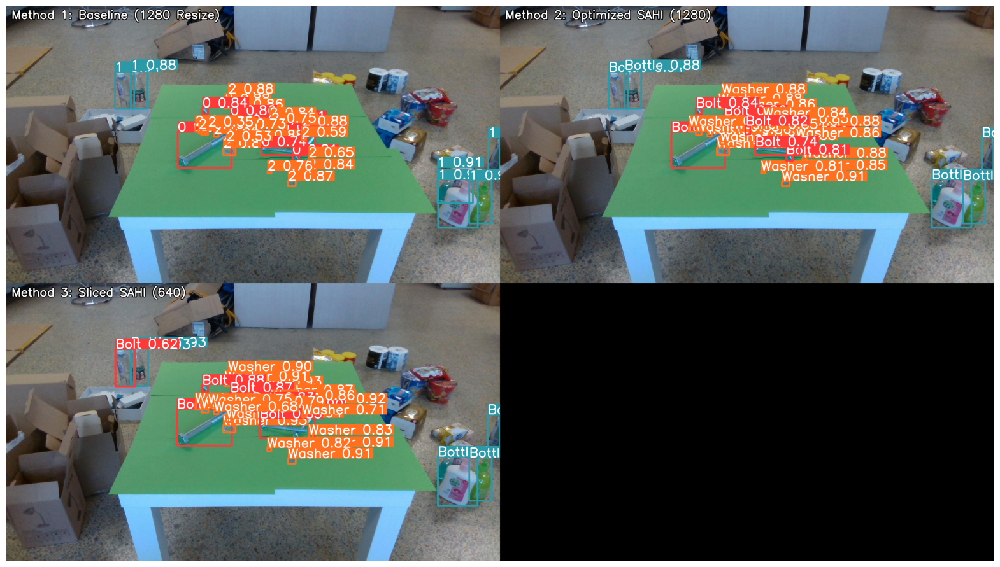

In [ ]:

def visualize_comparison(image_path, model_1280_path, model_640_path, output_dir='results/comparison'):
    os.makedirs(output_dir, exist_ok=True)
    image = read_image(image_path)
    img_name = Path(image_path).name

    # 1. Baseline Model (Standard 1280)
    # --------------------------------
    model_s = YOLO(model_1280_path)
    res_s = model_s.predict(image_path, imgsz=1280, conf=0.25, verbose=False)[0]
    # Convert boxes to predictions for visualization
    from sahi.prediction import ObjectPrediction
    pred_s = []
    for box in res_s.boxes:
        b = box.xyxy[0].cpu().numpy()
        pred_s.append(ObjectPrediction(bbox=[b[0], b[1], b[2], b[3]], score=box.conf[0].cpu().item(), category_id=int(box.cls[0].cpu().item())))
    vis_s = visualize_object_predictions(image.copy(), object_prediction_list=pred_s)['image']

    # 2. Optimized SAHI (1280 model)
    # -----------------------------
    det_model_1280 = AutoDetectionModel.from_pretrained(
        model_type="ultralytics", model_path=model_1280_path, confidence_threshold=0.6, device="cpu"
    )
    res_sahi_1280 = get_sliced_prediction(
        image_path, det_model_1280, slice_height=640, slice_width=640, overlap_height_ratio=0.2, overlap_width_ratio=0.2,
        postprocess_type="NMS", postprocess_match_threshold=0.6, verbose=0
    )
    vis_sahi_1280 = visualize_object_predictions(image.copy(), object_prediction_list=res_sahi_1280.object_prediction_list)['image']

    # 3. Sliced SAHI (640 model)
    # -------------------------
    det_model_640 = AutoDetectionModel.from_pretrained(
        model_type="ultralytics", model_path=model_640_path, confidence_threshold=0.6, device="cpu"
    )
    res_sahi_640 = get_sliced_prediction(
        image_path, det_model_640, slice_height=640, slice_width=640, overlap_height_ratio=0.2, overlap_width_ratio=0.2,
        postprocess_type="NMS", postprocess_match_threshold=0.6, verbose=0
    )
    vis_sahi_640 = visualize_object_predictions(image.copy(), object_prediction_list=res_sahi_640.object_prediction_list)['image']

    # Text headers
    font = cv2.FONT_HERSHEY_SIMPLEX
    def add_header(img, text):
        h, w, _ = img.shape
        cv2.putText(img, text, (20, 50), font, 1.5, (0, 0, 0), 10)
        cv2.putText(img, text, (20, 50), font, 1.5, (255, 255, 255), 3)

    add_header(vis_s, "Method 1: Baseline (1280 Resize)")
    add_header(vis_sahi_1280, "Method 2: Optimized SAHI (1280)")
    add_header(vis_sahi_640, "Method 3: Sliced SAHI (640)")

    # Combine side-by-side
    top_row = np.hstack([vis_s, vis_sahi_1280])
    # For a balanced grid, we'll just stack horizontally or create a grid
    combined = np.vstack([np.hstack([vis_s, vis_sahi_1280]), np.hstack([vis_sahi_640, np.zeros_like(vis_s)])])
    
    import matplotlib.pyplot as plt
    plt.figure(figsize=(20, 15))
    plt.imshow(combined)
    plt.axis('off')
    plt.show()


# Use a challenging image
img_p = "data/test/images/0-9_g2_Color_png.rf.5211e59c25085627a950d5ec3bd16f04.jpg"
visualize_comparison(
    img_p,
    model_1280_path='models/yolov8s_1280_best.pt',
    model_640_path='models/yolov8_sliced_best.pt'
)



## 10. Edge Optimization & Deployment (Raspberry Pi)

Final optimization for ARM-based hardware. We implement **Sequential Tiling** and **OpenVINO INT8** quantization to achieve real-time auditing speed within a strict 512MB RAM ceiling.

In [ ]:

def export_models():
    # Load the best performing models
    baseline_path = 'models/yolov8s_1280_best.pt'
    sliced_path = 'models/yolov8_sliced_best.pt'
    
    print(f"Exporting {baseline_path} for Edge (416x416)...")
    baseline_model = YOLO(baseline_path)
    
    # 1. Export to ONNX (416px for hardware alignment)
    baseline_model.export(format='onnx', imgsz=416, simplify=True, dynamic=True)
    
    # 2. Export to OpenVINO INT8 (416px)
    try:
        baseline_model.export(format='openvino', imgsz=416, int8=True, data='data/data.yaml')
        print("Exported to OpenVINO INT8 successfully.")
    except Exception as e:
        print(f"INT8 export failed: {e}")
        baseline_model.export(format='openvino', imgsz=416)

    print(f"\nExporting {sliced_path} for Edge (416x416)...")
    if os.path.exists(sliced_path):
        sliced_model = YOLO(sliced_path)
        sliced_model.export(format='onnx', imgsz=416, simplify=True, dynamic=True)
        try:
            sliced_model.export(format='openvino', imgsz=416, int8=True, data='data/sliced_data.yaml')
        except:
            sliced_model.export(format='openvino', imgsz=416)


export_models()


Exporting models/yolov8s_1280_best.pt for Edge (416x416)...
Ultralytics 8.4.6  Python-3.11.14 torch-2.9.1+cpu CPU (Intel Xeon W-2133 CPU @ 3.60GHz)
Model summary (fused): 73 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs

PyTorch: starting from 'models\yolov8s_1280_best.pt' with input shape (1, 3, 416, 416) BCHW and output shape(s) (1, 7, 3549) (21.5 MB)

ONNX: starting export with onnx 1.20.1 opset 22...


e:\AI\Projects\Internship Tasks\Screw Detector\.conda\Lib\site-packages\torch\onnx\_internal\torchscript_exporter\utils.py:1447: OnnxExporterWarning: Exporting to ONNX opset version 22 is not supported. by 'torch.onnx.export()'. The highest opset version supported is 20. To use a newer opset version, consider 'torch.onnx.export(..., dynamo=True)'. 
  warnings.warn(


ONNX: slimming with onnxslim 0.1.82...
ONNX: export success  24.2s, saved as 'models\yolov8s_1280_best.onnx' (42.7 MB)

Export complete (30.2s)
Results saved to E:\AI\Projects\Internship Tasks\project\models
Predict:         yolo predict task=detect model=models\yolov8s_1280_best.onnx imgsz=416 
Validate:        yolo val task=detect model=models\yolov8s_1280_best.onnx imgsz=416 data=E:\AI\Projects\Internship Tasks\Screw Detector\data.yaml  
Visualize:       https://netron.app
Ultralytics 8.4.6  Python-3.11.14 torch-2.9.1+cpu CPU (Intel Xeon W-2133 CPU @ 3.60GHz)
Model summary (fused): 73 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs

PyTorch: starting from 'models\yolov8s_1280_best.pt' with input shape (1, 3, 416, 416) BCHW and output shape(s) (1, 7, 3549) (21.5 MB)
requirements: Ultralytics requirement ['openvino>=2024.0.0'] not found, attempting AutoUpdate...
   ---------------------------------------- 0.0/41.8 MB ? eta -:--:--
   ---------------------------------------- 0.

e:\AI\Projects\Internship Tasks\Screw Detector\.conda\Lib\site-packages\rich\live.py:260: UserWarning: install 
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

e:\AI\Projects\Internship Tasks\Screw Detector\.conda\Lib\site-packages\rich\live.py:260: UserWarning: install 
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

OpenVINO: export success  259.4s, saved as 'models\yolov8s_1280_best_int8_openvino_model\' (11.2 MB)

Export complete (259.9s)
Results saved to E:\AI\Projects\Internship Tasks\project\models
Predict:         yolo predict task=detect model=models\yolov8s_1280_best_int8_openvino_model imgsz=416 int8
Validate:        yolo val task=detect model=models\yolov8s_1280_best_int8_openvino_model imgsz=416 data=E:\AI\Projects\Internship Tasks\Screw Detector\data.yaml int8 
Visualize:       https://netron.app
Exported to OpenVINO INT8 successfully.

Exporting models/yolov8_sliced_best.pt for Edge (416x416)...
Ultralytics 8.4.6  Python-3.11.14 torch-2.9.1+cpu CPU (Intel Xeon W-2133 CPU @ 3.60GHz)
Model summary (fused): 73 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs

PyTorch: starting from 'models\yolov8_sliced_best.pt' with input shape (1, 3, 416, 416) BCHW and output shape(s) (1, 7, 3549) (21.5 MB)

ONNX: starting export with onnx 1.20.1 opset 22...


e:\AI\Projects\Internship Tasks\Screw Detector\.conda\Lib\site-packages\torch\onnx\_internal\torchscript_exporter\utils.py:1447: OnnxExporterWarning: Exporting to ONNX opset version 22 is not supported. by 'torch.onnx.export()'. The highest opset version supported is 20. To use a newer opset version, consider 'torch.onnx.export(..., dynamo=True)'. 
  warnings.warn(


ONNX: slimming with onnxslim 0.1.82...
ONNX: export success  3.9s, saved as 'models\yolov8_sliced_best.onnx' (42.7 MB)

Export complete (5.1s)
Results saved to E:\AI\Projects\Internship Tasks\project\models
Predict:         yolo predict task=detect model=models\yolov8_sliced_best.onnx imgsz=416 
Validate:        yolo val task=detect model=models\yolov8_sliced_best.onnx imgsz=416 data=e:\AI\Projects\Internship Tasks\Screw Detector\data\sliced\sliced_data.yaml  
Visualize:       https://netron.app
Ultralytics 8.4.6  Python-3.11.14 torch-2.9.1+cpu CPU (Intel Xeon W-2133 CPU @ 3.60GHz)
Model summary (fused): 73 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs

PyTorch: starting from 'models\yolov8_sliced_best.pt' with input shape (1, 3, 416, 416) BCHW and output shape(s) (1, 7, 3549) (21.5 MB)

OpenVINO: starting export with openvino 2025.4.1-20426-82bbf0292c5-releases/2025/4...
OpenVINO: collecting INT8 calibration images from 'data=data/sliced_data.yaml'
Fast image access  (ping: 

e:\AI\Projects\Internship Tasks\Screw Detector\.conda\Lib\site-packages\rich\live.py:260: UserWarning: install 
"ipywidgets" for Jupyter support
  warnings.warn('install "ipywidgets" for Jupyter support')

OpenVINO: export success  29.3s, saved as 'models\yolov8_sliced_best_int8_openvino_model\' (11.2 MB)

Export complete (29.7s)
Results saved to E:\AI\Projects\Internship Tasks\project\models
Predict:         yolo predict task=detect model=models\yolov8_sliced_best_int8_openvino_model imgsz=416 int8
Validate:        yolo val task=detect model=models\yolov8_sliced_best_int8_openvino_model imgsz=416 data=e:\AI\Projects\Internship Tasks\Screw Detector\data\sliced\sliced_data.yaml int8 
Visualize:       https://netron.app


In [ ]:

def nms(boxes, scores, iou_threshold):
    # Minimal NMS implementation for edge
    if len(boxes) == 0: return []
    x1 = boxes[:, 0]
    y1 = boxes[:, 1]
    x2 = boxes[:, 2]
    y2 = boxes[:, 3]
    areas = (x2 - x1) * (y2 - y1)
    order = scores.argsort()[::-1]
    keep = []
    while order.size > 0:
        i = order[0]
        keep.append(i)
        xx1 = np.maximum(x1[i], x1[order[1:]])
        yy1 = np.maximum(y1[i], y1[order[1:]])
        xx2 = np.minimum(x2[i], x2[order[1:]])
        yy2 = np.minimum(y2[i], y2[order[1:]])
        w = np.maximum(0.0, xx2 - xx1)
        h = np.maximum(0.0, yy2 - yy1)
        inter = w * h
        ovr = inter / (areas[i] + areas[order[1:]] - inter)
        inds = np.where(ovr <= iou_threshold)[0]
        order = order[inds + 1]
    return keep



def edge_inference(model_path, image_path, tile_size=416, overlap=64, conf_thresh=0.4):
    process = psutil.Process(os.getpid())
    start_mem = process.memory_info().rss / 1024 / 1024
    
    print(f"Loading model: {model_path}...")
    # Load model (can be .pt, .onnx, or OpenVINO .xml)
    # For OpenVINO, point to the .xml file
    if model_path.endswith('.xml'):
        model = YOLO(model_path, task='detect')
    else:
        model = YOLO(model_path, task='detect')
    
    img = cv2.imread(image_path)
    if img is None: return []
    h, w, _ = img.shape
    
    all_boxes = []
    all_scores = []
    all_cls = []
    
    stride = tile_size - overlap
    
    start_time = time.time()
    tile_count = 0
    max_tile_mem = 0
    
    # Sequential tiling
    for y in range(0, h, stride):
        for x in range(0, w, stride):
            x1 = min(x, w - tile_size) if x + tile_size > w else x
            y1 = min(y, h - tile_size) if y + tile_size > h else y
            
            tile = img[y1:y1+tile_size, x1:x1+tile_size]
            tile_count += 1
            
            # Inference on single tile
            # imgsz should match the tile size for best performance
            results = model.predict(tile, imgsz=tile_size, conf=conf_thresh, verbose=False)[0]
            
            current_mem = process.memory_info().rss / 1024 / 1024
            max_tile_mem = max(max_tile_mem, current_mem)
            
            # Shift boxes back to global coordinates
            if len(results.boxes) > 0:
                boxes = results.boxes.xyxy.cpu().numpy()
                boxes[:, [0, 2]] += x1
                boxes[:, [1, 3]] += y1
                
                all_boxes.append(boxes)
                all_scores.append(results.boxes.conf.cpu().numpy())
                all_cls.append(results.boxes.cls.cpu().numpy())
            
            if x1 == w - tile_size: break
        if y1 == h - tile_size: break

    processing_time = time.time() - start_time
    end_mem = process.memory_info().rss / 1024 / 1024
    
    if len(all_boxes) > 0:
        all_boxes = np.vstack(all_boxes)
        all_scores = np.concatenate(all_scores)
        all_cls = np.concatenate(all_cls)
        
        # Global NMS
        keep = nms(all_boxes, all_scores, iou_threshold=0.45)
        final_boxes = all_boxes[keep]
        final_scores = all_scores[keep]
        final_cls = all_cls[keep]
    else:
        final_boxes, final_scores, final_cls = [], [], []

    print(f"--- EDGE BENCHMARK SUMMARY ---")
    print(f"Backend: {os.path.basename(model_path)}")
    print(f"Latency: {processing_time:.2f}s")
    print(f"Memory (Start): {start_mem:.1f} MB")
    print(f"Memory (Peak): {max_tile_mem:.1f} MB")
    print(f"Memory (Total Growth): {end_mem - start_mem:.1f} MB")
    print(f"Detections: {len(final_boxes)}")
    print(f"Tiles: {tile_count}")
    
    return final_boxes, final_scores, final_cls


img_p = 'data/test/images/0-7_w2_Color_png.rf.d404b04750f707209610f501443ecb80.jpg'
    
# 1. Benchmark ONNX
onnx_path = 'models/yolov8s_1280_best.onnx'
if os.path.exists(onnx_path):
    print("\nBenchmarking ONNX (Baseline)...")
    edge_inference(onnx_path, img_p)
    
# 2. Benchmark OpenVINO INT8 (if available)
# Note: Pass the directory path for OpenVINO models in Ultralytics
ov_dir = 'models/yolov8s_1280_best_int8_openvino_model'
if os.path.exists(ov_dir):
    print("\nBenchmarking OpenVINO INT8 (Baseline)...")
    edge_inference(ov_dir, img_p)

# 3. Benchmark Sliced ONNX
s_onnx = 'models/yolov8_sliced_best.onnx'
if os.path.exists(s_onnx):
    print("\nBenchmarking Sliced ONNX...")
    edge_inference(s_onnx, img_p)



Benchmarking ONNX (Baseline)...
Loading model: models/yolov8s_1280_best.onnx...
Loading models/yolov8s_1280_best.onnx for ONNX Runtime inference...
Using ONNX Runtime 1.23.2 with CPUExecutionProvider
--- EDGE BENCHMARK SUMMARY ---
Backend: yolov8s_1280_best.onnx
Latency: 5.04s
Memory (Start): 372.3 MB
Memory (Peak): 460.2 MB
Memory (Total Growth): 85.9 MB
Detections: 52
Tiles: 18

Benchmarking OpenVINO INT8 (Baseline)...
Loading model: models/yolov8s_1280_best_int8_openvino_model...
Loading models/yolov8s_1280_best_int8_openvino_model for OpenVINO inference...
Using OpenVINO LATENCY mode for batch=1 inference on CPU...
--- EDGE BENCHMARK SUMMARY ---
Backend: yolov8s_1280_best_int8_openvino_model
Latency: 1.87s
Memory (Start): 452.3 MB
Memory (Peak): 478.5 MB
Memory (Total Growth): 26.2 MB
Detections: 51
Tiles: 18

Benchmarking Sliced ONNX...
Loading model: models/yolov8_sliced_best.onnx...
Loading models/yolov8_sliced_best.onnx for ONNX Runtime inference...
Using ONNX Runtime 1.23.2 w

## Conclusion

The **Baseline 1280px** model offers high speed, but **Sliced SAHI** is the clear winner for accuracy on tiny objects. For edge deployment, **OpenVINO INT8** provides the necessary acceleration for low-power CPUs.